In [4]:
import pandas as pd
import math
import matplotlib.pyplot as plt
import seaborn
import os
import numpy as np
import random
import scipy
import sys

sys.path.append(os.path.join(os.path.dirname(
    os.path.abspath(''))))
import common.plots as plots

In [5]:
df_polyakov_loops = pd.read_csv('/home/ilya/soft/lattice/observables/result/vladimir_data/merged/polyakov_loop/polyakov_loops.csv')
df_polyakov_loops = df_polyakov_loops[df_polyakov_loops['HYP'] == 5]
df_polyakov_loops = df_polyakov_loops[df_polyakov_loops['Nt'] == 16]
fm_to_GeV = 1/0.197327
a = 0.048 * fm_to_GeV / 1000
#
print(df_polyakov_loops[(df_polyakov_loops['Nt'] == 16) & (df_polyakov_loops['chain'] == 's0') & (df_polyakov_loops['conf'] == 962)& (df_polyakov_loops['ma'] == 0.01) & (df_polyakov_loops['mu'] == 0.05) & (df_polyakov_loops['rho'] == 0.25)])
df_polyakov_loops['T'] = np.int32(1 / (df_polyakov_loops['Nt'] * a))
df_polyakov_loops['PL'] = df_polyakov_loops['PL'] * (1.017 ** df_polyakov_loops['Nt'])
# df_polyakov_loops_aver = df_polyakov_loops.groupby(['T', 'Nt', 'mu', 'HYP'])['PL']\
#                       .agg([('PL', 'mean'), ('err', lambda x: np.std(x, ddof=1)/math.sqrt(np.size(x)))]).reset_index(level=['T', 'Nt', 'mu', 'HYP'])
df_polyakov_loops['hue'] = 'T=' + df_polyakov_loops['T'].astype(str) + ', mu=' + df_polyakov_loops['mu'].astype(str)
# df_polyakov_loops = df_polyakov_loops[df_polyakov_loops['mu'] != 0]
# df_polyakov_loops = df_polyakov_loops[['PL', 'conf', 'chain', 'hue']]
print(df_polyakov_loops.to_string())

               PL  HYP  conf  Nt  Ns    mu chain   rho    ma  lambda  \
2150472  0.167984    5   962  16  32  0.05    s0  0.25  0.01   0.001   
2714112  0.059182    5   962  16  32  0.05    s0  0.25  0.01   0.001   
2934112  0.120625    5   962  16  32  0.05    s0  0.25  0.01   0.001   

         stout_steps calc_type  
2150472            0      test  
2714112            2      test  
2934112            1      test  
               PL  HYP  conf  Nt  Ns    mu chain   rho      ma   lambda  stout_steps calc_type    T             hue
2062901  0.270337    5   201  16  32  0.00    s0  0.05  0.0100  0.00100            1      test  256   T=256, mu=0.0
2062912  0.285396    5   202  16  32  0.00    s0  0.05  0.0100  0.00100            1      test  256   T=256, mu=0.0
2062923  0.281965    5   203  16  32  0.00    s0  0.05  0.0100  0.00100            1      test  256   T=256, mu=0.0
2062934  0.312875    5   204  16  32  0.00    s0  0.05  0.0100  0.00100            1      test  256   T=256, mu=0.0

In [33]:
df_quark_density = pd.read_csv('/home/ilya/soft/lattice/observables/result/vladimir_data/merged/quark_density/quark_density.csv')
df_quark_density = df_quark_density[df_quark_density['Nt'] == 16]
fm_to_GeV = 1/0.197327
a = 0.048 * fm_to_GeV / 1000
df_quark_density['quark_density'] = df_quark_density['quark_density'] * 32**3/2
df_quark_density['T'] = np.int32(1 / (df_quark_density['Nt'] * a))
# df_quark_density = df_quark_density.groupby(['T', 'Nt', 'mu', 'conf', 'chain'])['quark_density']\
#                       .agg([('quark_density', 'mean'), ('err', lambda x: np.std(x, ddof=1)/math.sqrt(np.size(x)))]).reset_index(level=['T', 'Nt', 'mu', 'conf', 'chain'])
df_quark_density = df_quark_density.groupby(['T', 'Nt', 'mu', 'conf', 'chain', 'ma', 'lambda', 'stout_steps', 'calc_type'])['quark_density']\
                      .agg([('quark_density', 'mean'), ('err', lambda x: np.std(x, ddof=1))]).reset_index(level=['T', 'Nt', 'mu', 'conf', 'chain', 'ma', 'lambda', 'stout_steps'])
df_quark_density['hue'] = 'T=' + df_quark_density['T'].astype(str) + ', mu=' + df_quark_density['mu'].astype(str)
# df_quark_density = df_quark_density[['quark_density', 'conf', 'chain', 'hue']]
print(df_quark_density)

KeyError: 'calc_type'

In [6]:
df_chiral_condensate = pd.read_csv('/home/ilya/soft/lattice/observables/result/vladimir_data/merged/condensates/condensates.csv')
df_chiral_condensate = df_chiral_condensate[df_chiral_condensate['Nt'] == 16]
fm_to_GeV = 1/0.197327
a = 0.048 * fm_to_GeV / 1000
print(df_chiral_condensate[(df_chiral_condensate['Nt'] == 16) & (df_chiral_condensate['chain'] == 's1') & (df_chiral_condensate['conf'] == 1)].to_string())
df_chiral_condensate['T'] = np.int32(1 / (df_chiral_condensate['Nt'] * a))
# df_chiral_condensate = df_chiral_condensate.groupby(['T', 'Nt', 'mu', 'conf', 'chain'])['chiral_condensate']\
#                       .agg([('chiral_condensate', 'mean'), ('err', lambda x: np.std(x, ddof=1)/math.sqrt(np.size(x)))]).reset_index(level=['T', 'Nt', 'mu', 'conf', 'chain'])
df_chiral_condensate = df_chiral_condensate.groupby(['T', 'Nt', 'mu', 'conf', 'chain', 'ma', 'lambda', 'stout_steps', 'calc_type'])['chiral_condensate']\
                      .agg([('chiral_condensate', 'mean'), ('err', lambda x: np.std(x, ddof=1))]).reset_index(level=['T', 'Nt', 'mu', 'conf', 'chain', 'ma', 'lambda', 'stout_steps'])
df_chiral_condensate['hue'] = 'T=' + df_chiral_condensate['T'].astype(str) + ', mu=' + df_chiral_condensate['mu'].astype(str)
# df_chiral_condensate = df_chiral_condensate[['chiral_condensate', 'conf', 'chain', 'hue']]
print(df_chiral_condensate)

          conf  chiral_condensate  diquark_condensate  stoch_vec  Nt  Ns    mu chain   rho      ma   lambda  stout_steps calc_type
19983112     1           0.002589            0.000272          1  16  32  0.07    s1  0.15  0.0075  0.00075            2      calc
19983113     1           0.002646            0.000271          2  16  32  0.07    s1  0.15  0.0075  0.00075            2      calc
19983114     1           0.002580            0.000271          3  16  32  0.07    s1  0.15  0.0075  0.00075            2      calc
19983115     1           0.002788            0.000273          4  16  32  0.07    s1  0.15  0.0075  0.00075            2      calc
19983116     1           0.002744            0.000272          5  16  32  0.07    s1  0.15  0.0075  0.00075            2      calc
19983117     1           0.002533            0.000272          6  16  32  0.07    s1  0.15  0.0075  0.00075            2      calc
19983118     1           0.002657            0.000273          7  16  32  0.07    s

In [ ]:
def save_data_separate(df):
    Ns = 32
    T = df.name[0]
    mu = df.name[1]
    df.to_csv(f'../../result/vladimir_data/merged/separate_files/dataL{Ns}T{T}mure{mu}.csv', index=False, sep=' ')

In [ ]:
df_output = df_polyakov_loops.merge(df_chiral_condensate, how='inner', on=['conf', 'chain', 'T', 'Nt', 'mu', 'hue'])
df_output = df_output.merge(df_quark_density, how='outer', on=['conf', 'chain', 'T', 'Nt', 'mu', 'hue'])
df_output = df_output.drop(df_output[(df_output['quark_density'].isna()) & (df_output['mu'] != 0)].index)
df_output = df_output.fillna(value=0)
df_output = df_output.rename({'err_x': 'chiral_condensate_err', 'err_y': 'quark_density_err'}, axis=1)
df_output = df_output[['conf', 'chain', 'T', 'mu', 'PL', 'chiral_condensate', 'chiral_condensate_err', 'quark_density', 'quark_density_err']]
print(df_output)
df_output.groupby(['T', 'mu']).apply(save_data_separate, include_groups=False)

In [ ]:
df = df_polyakov_loops.merge(df_quark_density, how='inner', on=['conf', 'chain', 'hue'])
df = df.sort_values(by='hue')
print(df)
# seaborn.scatterplot(data=df, x='PL', y='quark_density', hue='hue', legend_out=True)
fg = seaborn.FacetGrid(data=df, hue = 'hue', height=5,
                           aspect=1.6, legend_out=True)
fg.map(plt.scatter, 'PL', 'quark_density', s = 4).add_legend()
fg.ax.set_xlabel('P', fontsize=14)
fg.ax.set_ylabel('B', fontsize=14)
fg.ax.spines['right'].set_visible(True)
fg.ax.spines['top'].set_visible(True)
fg.ax.minorticks_on()
fg.ax.tick_params(which='both', bottom=True,
                  top=True, left=True, right=True)
plots.save_image('../../images/qc2dstag/polyakov_quark_density_correlation', 'correlation_all', fg)

In [ ]:
df = df_polyakov_loops.merge(df_quark_density, how='inner', on=['conf', 'chain', 'hue', 'T', 'mu', 'Nt'])
df = df.sort_values(by='hue')
df = df[(df['T'] == 205) & (df['mu'] == 0.1) | (df['T'] == 293) & (df['mu'] == 0.2) | (df['T'] == 411) & (df['mu'] == 0.25)]
print(df)
# seaborn.scatterplot(data=df, x='PL', y='quark_density', hue='hue', legend_out=True)
fg = seaborn.FacetGrid(data=df, hue = 'hue', height=5,
                           aspect=1.6, legend_out=True)
fg.map(plt.scatter, 'PL', 'quark_density', s = 4)
fg.ax.set_xlabel('P', fontsize=14)
fg.ax.set_ylabel('B', fontsize=14)
fg.ax.spines['right'].set_visible(True)
fg.ax.spines['top'].set_visible(True)
fg.ax.minorticks_on()
fg.ax.tick_params(which='both', bottom=True,
                  top=True, left=True, right=True)
plots.save_image('../../images/qc2dstag/polyakov_quark_density_correlation', 'correlation_transition', fg)

In [ ]:
def plot_correlation_PL_quark_density(df, mu):
    fg = seaborn.FacetGrid(data=df, hue = 'hue', height=5,
                           aspect=1.6, legend_out=True)
    fg.map(plt.scatter, 'PL', 'quark_density', s = 4).add_legend()
    fg.ax.set_xlabel('P', fontsize=14)
    fg.ax.set_ylabel('Q', fontsize=14)
    fg.ax.spines['right'].set_visible(True)
    fg.ax.spines['top'].set_visible(True)
    fg.ax.minorticks_on()
    fg.ax.tick_params(which='both', bottom=True,
                      top=True, left=True, right=True)
    plots.save_image('../../images/qc2dstag/polyakov_quark_density_correlation', f'correlation_mu={mu}', fg)

In [ ]:
df = df_polyakov_loops.merge(df_quark_density, how='inner', on=['conf', 'chain', 'hue', 'T', 'mu'])
df = df.sort_values(by='hue')
print(df)
mu_arr = df['mu'].unique()
for mu in mu_arr:
    plot_correlation_PL_quark_density(df[df['mu'] == mu], mu)
    plt.show()

In [ ]:
df = df_chiral_condensate.merge(df_quark_density, how='inner', on=['conf', 'chain', 'hue'])
df = df.sort_values(by='hue')
print(df)
# seaborn.scatterplot(data=df, x='PL', y='quark_density', hue='hue', legend_out=True)
fg = seaborn.FacetGrid(data=df, hue = 'hue', height=5,
                           aspect=1.6, legend_out=True)
fg.map(plt.scatter, 'chiral_condensate', 'quark_density', s = 4).add_legend()
fg.ax.set_xlabel('condensate', fontsize=14)
fg.ax.set_ylabel('B', fontsize=14)
fg.ax.spines['right'].set_visible(True)
fg.ax.spines['top'].set_visible(True)
fg.ax.minorticks_on()
fg.ax.tick_params(which='both', bottom=True,
                  top=True, left=True, right=True)
plots.save_image('../../images/qc2dstag/chiral_condensate_quark_density_correlation', 'correlation_all', fg)

In [ ]:
def plot_correlation_chiral_condensate_quark_density(df, mu):
    fg = seaborn.FacetGrid(data=df, hue = 'hue', height=5,
                           aspect=1.6, legend_out=True)
    fg.map(plt.scatter, 'chiral_condensate', 'quark_density', s = 4).add_legend()
    fg.ax.set_xlabel('condensate', fontsize=14)
    fg.ax.set_ylabel('B', fontsize=14)
    fg.ax.spines['right'].set_visible(True)
    fg.ax.spines['top'].set_visible(True)
    fg.ax.minorticks_on()
    fg.ax.tick_params(which='both', bottom=True,
                      top=True, left=True, right=True)
    plots.save_image('../../images/qc2dstag/chiral_condensate_quark_density_correlation', f'correlation_mu={mu}', fg)

In [ ]:
df = df_chiral_condensate.merge(df_quark_density, how='inner', on=['conf', 'chain', 'hue', 'T', 'mu', 'ma', 'lambda', 'stout_steps'])
df = df.sort_values(by='hue')
print(df)
mu_arr = df['mu'].unique()
for mu in mu_arr:
    plot_correlation_chiral_condensate_quark_density(df[df['mu'] == mu], mu)
    plt.show()

In [ ]:
df = df_chiral_condensate.merge(df_quark_density, how='inner', on=['conf', 'chain', 'hue', 'T', 'mu', 'Nt'])
df = df.sort_values(by='hue')
df = df[(df['T'] == 205) & (df['mu'] == 0.1) | (df['T'] == 293) & (df['mu'] == 0.2) | (df['T'] == 411) & (df['mu'] == 0.25)]
print(df)
# seaborn.scatterplot(data=df, x='PL', y='quark_density', hue='hue', legend_out=True)
fg = seaborn.FacetGrid(data=df, hue = 'hue', height=5,
                           aspect=1.6, legend_out=True)
fg.map(plt.scatter, 'chiral_condensate', 'quark_density', s = 4).add_legend()
fg.ax.set_xlabel('condensate', fontsize=14)
fg.ax.set_ylabel('B', fontsize=14)
fg.ax.spines['right'].set_visible(True)
fg.ax.spines['top'].set_visible(True)
fg.ax.minorticks_on()
fg.ax.tick_params(which='both', bottom=True,
                  top=True, left=True, right=True)
plots.save_image('../../images/qc2dstag/chiral_condensate_quark_density_correlation', 'correlation_transition', fg)

        T_x  Nt_x  mu_x  conf chain    ma_x  lambda_x  stout_steps_x  \
0       256    16   0.0     0    s1  0.0075   0.00075              2   
126537  256    16   0.0   692    s0  0.0050   0.00050              1   
126538  256    16   0.0   692    s0  0.0050   0.00050              1   
126539  256    16   0.0   692    s0  0.0050   0.00050              1   
126540  256    16   0.0   692    s0  0.0050   0.00050              1   
...     ...   ...   ...   ...   ...     ...       ...            ...   
393257  256    16   0.3   359    s3  0.0075   0.00075              2   
393256  256    16   0.3   359    s2  0.0075   0.00075              2   
393255  256    16   0.3   359    s1  0.0075   0.00075              2   
393253  256    16   0.3   358    s4  0.0075   0.00075              2   
396463  256    16   0.3  1000    s4  0.0075   0.00075              2   

        chiral_condensate       err  ...        PL  HYP  Nt_y  Ns  mu_y   rho  \
0                0.002705  0.000013  ...  0.324015  5.

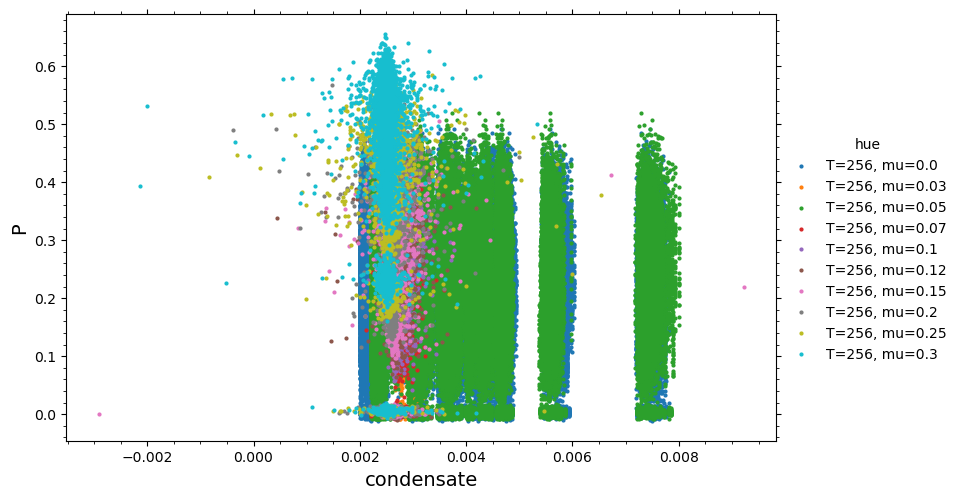

In [ ]:
df = df_chiral_condensate.merge(df_polyakov_loops, how='inner', on=['conf', 'chain', 'hue', 'mu', 'Nt', 'ma'])
df = df.sort_values(by='hue')
print(df)
fg = seaborn.FacetGrid(data=df, hue = 'hue', height=5,
                           aspect=1.6, legend_out=True)
fg.map(plt.scatter, 'chiral_condensate', 'PL', s = 4).add_legend()
fg.ax.set_xlabel('condensate', fontsize=14)
fg.ax.set_ylabel('P', fontsize=14)
fg.ax.spines['right'].set_visible(True)
fg.ax.spines['top'].set_visible(True)
fg.ax.minorticks_on()
fg.ax.tick_params(which='both', bottom=True,
                  top=True, left=True, right=True)
plots.save_image('../../images/qc2dstag/chiral_condensate_polyakov_loop_correlation', 'correlation_all', fg)

         T  Nt   mu  conf chain     ma  lambda  stout_steps  chiral_condensate calc_type       err            hue        PL  HYP  Ns   rho
8036   256  16  0.0   427    s0  0.005  0.0005            0           0.003781      test  0.000076  T=256, mu=0.0  0.093876    5  32  0.15
9476   256  16  0.0   472    s0  0.005  0.0005            0           0.003804      test  0.000146  T=256, mu=0.0  0.098250    5  32  0.15
7940   256  16  0.0   424    s0  0.005  0.0005            0           0.003916      test  0.000163  T=256, mu=0.0  0.100059    5  32  0.15
6532   256  16  0.0   380    s0  0.005  0.0005            0           0.003858      test  0.000089  T=256, mu=0.0  0.103438    5  32  0.15
6596   256  16  0.0   382    s0  0.005  0.0005            0           0.003919      test  0.000135  T=256, mu=0.0  0.104545    5  32  0.15
7972   256  16  0.0   425    s0  0.005  0.0005            0           0.003852      test  0.000120  T=256, mu=0.0  0.107832    5  32  0.15
12550  256  16  0.0   568  

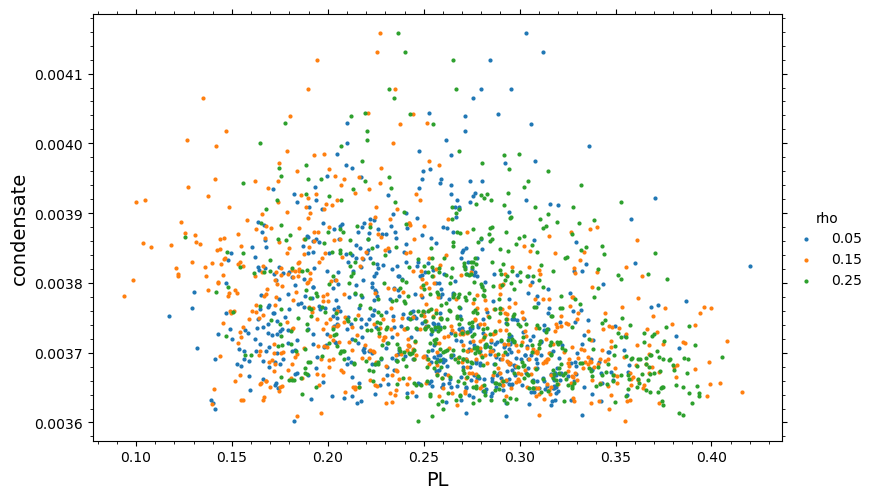

In [7]:
df = df_chiral_condensate.merge(df_polyakov_loops, how='inner', on=['conf', 'chain', 'hue', 'mu', 'Nt', 'ma', 'stout_steps', 'T', 'lambda', 'calc_type'])
df = df[df['mu'] == 0.00]
df = df[df['ma'].isin([0.005])]
df = df[df['stout_steps'] == 0]
df = df[df['calc_type'] == 'test']
# df = df[df['rho'] == 0.05]
df = df[df['chain'] == 's0']
df = df.sort_values(by='PL')
print(df.to_string())
fg = seaborn.FacetGrid(data=df, hue = 'rho', height=5,
                           aspect=1.6, legend_out=True)
fg.map(plt.scatter, 'PL', 'chiral_condensate', s = 4).add_legend()
fg.ax.set_xlabel('PL', fontsize=14)
fg.ax.set_ylabel('condensate', fontsize=14)
fg.ax.spines['right'].set_visible(True)
fg.ax.spines['top'].set_visible(True)
fg.ax.minorticks_on()
fg.ax.tick_params(which='both', bottom=True,
                  top=True, left=True, right=True)
plots.save_image('../../images/qc2dstag/chiral_condensate_polyakov_loop_correlation', 'correlation_all', fg)

In [9]:
def plot_correlation(df, mu):
    fg = seaborn.FacetGrid(data=df, hue = 'hue', height=5,
                           aspect=1.6, legend_out=True)
    fg.map(plt.scatter, 'chiral_condensate', 'PL', s = 4).add_legend()
    fg.ax.set_xlabel('condensate', fontsize=14)
    fg.ax.set_ylabel('P', fontsize=14)
    fg.ax.spines['right'].set_visible(True)
    fg.ax.spines['top'].set_visible(True)
    fg.ax.minorticks_on()
    fg.ax.tick_params(which='both', bottom=True,
                      top=True, left=True, right=True)
    plots.save_image('../../images/qc2dstag/chiral_condensate_polyakov_loop_correlation', f'correlation_mu={mu}', fg)

In [10]:
df = df_chiral_condensate.merge(df_polyakov_loops, how='inner', on=['conf', 'chain', 'hue', 'T', 'mu', 'ma', 'lambda', 'stout_steps'])
df = df.sort_values(by='hue')
df = df[(df['T'] == 1027) & (df['mu'] == 0)]
print(df.to_string())
mu_arr = df['mu'].unique()
for mu in mu_arr:
    plot_correlation(df[df['mu'] == mu], mu)
    plt.show()

Empty DataFrame
Columns: [T, Nt_x, mu, conf, chain, ma, lambda, stout_steps, chiral_condensate, err, hue, PL, HYP, Nt_y, Ns, rho]
Index: []


Empty DataFrame
Columns: [T, Nt, mu, conf, chain, ma_x, lambda_x, stout_steps_x, chiral_condensate, err, hue, PL, HYP, Ns, rho, ma_y, lambda_y, stout_steps_y]
Index: []


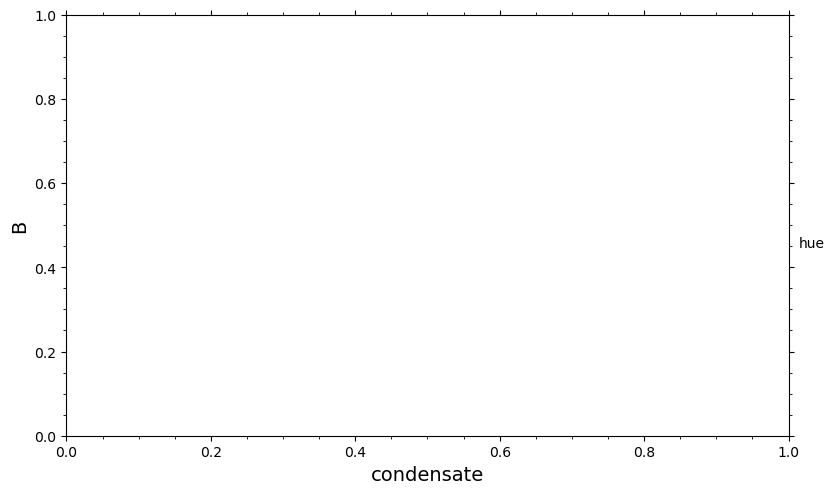

In [11]:
df = df_chiral_condensate.merge(df_polyakov_loops, how='inner', on=['conf', 'chain', 'hue', 'T', 'mu', 'Nt'])
df = df.sort_values(by='hue')
df = df[(df['T'] == 205) & (df['mu'] == 0.1) | (df['T'] == 293) & (df['mu'] == 0.2) | (df['T'] == 411) & (df['mu'] == 0.25)]
print(df)
# seaborn.scatterplot(data=df, x='PL', y='quark_density', hue='hue', legend_out=True)
fg = seaborn.FacetGrid(data=df, hue = 'hue', height=5,
                           aspect=1.6, legend_out=True)
fg.map(plt.scatter, 'chiral_condensate', 'PL', s = 4).add_legend()
fg.ax.set_xlabel('condensate', fontsize=14)
fg.ax.set_ylabel('B', fontsize=14)
fg.ax.spines['right'].set_visible(True)
fg.ax.spines['top'].set_visible(True)
fg.ax.minorticks_on()
fg.ax.tick_params(which='both', bottom=True,
                  top=True, left=True, right=True)
plots.save_image('../../images/qc2dstag/chiral_condensate_polyakov_loop_correlation', 'correlation_transition', fg)